**This notebook is for binary segmentation for skin lesion detection. ISIC dataset is used. I used the TensorFlow data processing pipeline (tf.io) for data preprocessing, and I augmented the training data using the albumentations library. The loss function employed a combination of BCE and dice-loss, while callbacks such as ReduceLRonPlateau were used for enhancing the training process. Additionally, earlystopping and modelcheckpoint callbacks were implemented to prevent overfitting and save the best performing model.**

# Imports and Preparing Environment

In [1]:
!pip install albumentations

In [60]:
import numpy as np
import tensorflow as tf 
from tensorflow.keras import layers
import os
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback
from tensorflow.keras import backend as K
import albumentations as A
from functools import partial
from tqdm import tqdm

In [61]:
seed = 42
np.random.seed(seed)

In [62]:
from tensorflow.keras.callbacks import Callback

In [63]:
print(tf.__version__)

2.11.0


In [64]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

# Getting the data

In [65]:
os.listdir('/kaggle/input/isic2018-challenge-task1-data-segmentation')

['ISIC2018_Task1-2_Training_Input',
 'ISIC2018_Task1_Training_GroundTruth',
 'ISIC2018_Task1-2_Test_Input',
 'ISIC2018_Task1-2_Validation_Input']

In [66]:
train_img_folder_path = "/kaggle/input/isic2018-challenge-task1-data-segmentation/ISIC2018_Task1-2_Training_Input"
train_label_folder_path = "/kaggle/input/isic2018-challenge-task1-data-segmentation/ISIC2018_Task1_Training_GroundTruth"
val_folder_path = "/kaggle/input/isic2018-challenge-task1-data-segmentation/ISIC2018_Task1-2_Validation_Input"
test_folder_path = "/kaggle/input/isic2018-challenge-task1-data-segmentation/ISIC2018_Task1-2_Test_Input"

In [67]:
# Checking if paths are correct
exist_condition = os.path.exists(train_img_folder_path) and os.path.exists(train_label_folder_path) and os.path.exists(val_folder_path) and os.path.exists(test_folder_path)
print("Files not found") if exist_condition == False else None

# Visualize the data

In [68]:
# This array contains paths for the images. Folder contains a text file, we only want images I used endswith function to get jpg files
train_images_path = np.sort([os.path.join(train_img_folder_path, i) for i in os.listdir(train_img_folder_path) if i.endswith('.jpg')])
train_labels_path = np.sort([os.path.join(train_label_folder_path, i) for i in os.listdir(train_label_folder_path) if i.endswith('.png')])
test_images_path = np.sort([os.path.join(test_folder_path, i) for i in os.listdir(test_folder_path) if i.endswith('.jpg')])

In [69]:
train_split = 0.8
val_images_path = train_images_path[int(train_split*len(train_images_path)):]
val_labels_path = train_labels_path[int(train_split*len(train_labels_path)):]
train_images_path = train_images_path[:int(train_split*len(train_images_path))]
train_labels_path = train_labels_path[:int(train_split*len(train_labels_path))]

In [70]:
len(train_images_path) + len(val_images_path)

2594

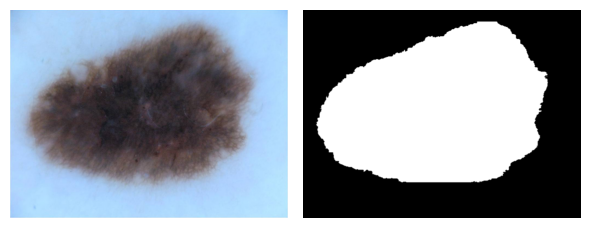

In [71]:
# Visualizing first train image with its label.
img1 = Image.open(train_images_path[0])
img1.thumbnail((512, 512))
img1_label = Image.open(train_labels_path[0])
img1_label.thumbnail((512, 512))
plt.subplots(figsize=(6,3))
plt.subplot(1,2,1)
plt.imshow(img1)
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(img1_label, cmap='gray')
plt.axis('off')
plt.tight_layout()
plt.show()

In [72]:
# This function plots 25 random images with segmantation mask.
def plot_segmentation_images(image_path, image_label_path, size=512, Random=True):
    figure = plt.subplots(figsize=(25, 25))
    
    # plotting rows iterating through 
    for i in range(25): 
        random_number = np.random.randint(len(image_path)) if Random else i
        img = Image.open(image_path[random_number])
        img_label = Image.open(image_label_path[random_number])
        img = img.resize((size, size))
        img_label = img_label.resize((size, size))
        img = np.array(img)
        img_label = np.array(img_label)
        mask = np.ma.masked_where(img_label>0, img_label)
        img_label_mask = np.ma.masked_array(img_label, mask)
        img_name = image_label_path[random_number].split('/')[-1]

        plt.subplot(5, 5, i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(img, cmap='gray')
        plt.imshow(img_label_mask, cmap='jet', alpha=0.4)
        plt.xlabel(f'ID: {img_name}', fontsize=15)
    plt.show()

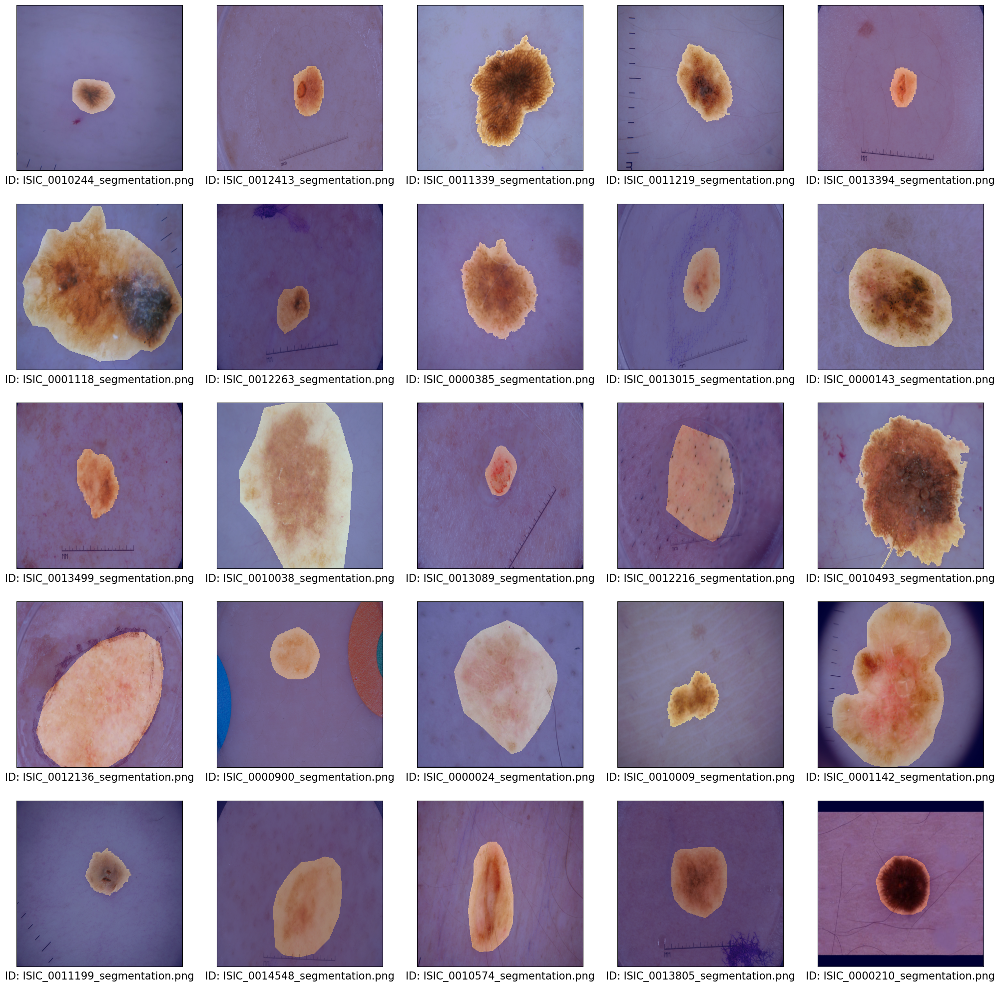

In [73]:
# Plots 25 random train images.
plot_segmentation_images(train_images_path, train_labels_path)

# Loading The Data

Few notes before starting. In a previous version of my code, I used Imagedatagenerator(). However, this method is now deprecated and not recommended by TensorFlow documentation. Additionally, it is much slower than using tf.Data, which is what I am using in this version of my code.

I will also be using a portion of the training data as the validation input since there is no validation ground truth in the dataset. Finally, I will be utilizing the pipelining features of tf.data even though the dataset is relatively small, as it can help improve performance and scalability in larger datasets.

In [74]:
IMG_SIZE = 256
IMG_CHANNELS = 3
batch_size = 8
buffer_size = 1000
steps_per_epoch = len(train_images_path) // batch_size
AUTOTUNE = tf.data.AUTOTUNE

In [75]:
x_train_ds = tf.data.Dataset.list_files(train_images_path, seed=seed)
y_train_ds = tf.data.Dataset.list_files(train_labels_path, seed=seed)
x_val_ds = tf.data.Dataset.list_files(val_images_path, seed=seed)
y_val_ds = tf.data.Dataset.list_files(val_labels_path, seed=seed)

In [76]:
def parse_image(img_path, size=(256,256)):
    image = tf.io.read_file(img_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, size)
    return image

def parse_gt(gt_path, size=(256,256)):
    gt = tf.io.read_file(gt_path)
    gt = tf.image.decode_png(gt, channels=1)
    gt = tf.image.resize(gt, size, method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    gt = tf.where(gt == 0, 0, 1)
    gt = tf.image.convert_image_dtype(gt, tf.int32)
    return gt

In [77]:
x_train_ds = x_train_ds.map(parse_image)
y_train_ds = y_train_ds.map(parse_gt)
x_val_ds = x_val_ds.map(parse_image)
y_val_ds = y_val_ds.map(parse_gt)

In [78]:
print(f'Train x size: {len(x_train_ds)}')
print(f'Validation x size: {len(x_val_ds)}')
print(f'Train y size: {len(y_train_ds)}')
print(f'Validation y size: {len(y_val_ds)}')

Train x size: 2075
Validation x size: 519
Train y size: 2075
Validation y size: 519


In [79]:
train_ds = tf.data.Dataset.zip((x_train_ds, y_train_ds))
val_ds = tf.data.Dataset.zip((x_val_ds, y_val_ds))

In [80]:
def augment(image, mask, size=(256, 256)):
  transforms = A.Compose([
      A.OneOf([
          A.Transpose(),
          A.VerticalFlip(),
          A.HorizontalFlip(),
          A.RandomRotate90(),
          A.NoOp()], p=0.75),

      A.ShiftScaleRotate(p=0.1),
      A.GridDistortion(p=0.1),
      A.ElasticTransform(p=0.1),

      A.OneOf([
          A.RandomBrightnessContrast(),    
          A.RandomGamma()], p=0.2)
      
    ], additional_targets={'mask': 'mask'})

  data = {"image":image, "mask":mask}
  aug_data = transforms(**data)

  aug_img = aug_data["image"]
  aug_img = tf.cast(aug_img, tf.float32)

  aug_mask = aug_data["mask"]
  # Making sure labels are binary (background or label)
  aug_mask = np.where(aug_mask == 0, 0, 1)
  aug_mask = tf.cast(aug_mask, tf.int32)
  return aug_img, aug_mask

# I got "Tensor has no attribute .numpy() method" error. To fix this I used tf.numpy_function()
def process_data(image, mask, h=256, w=256):
  image, mask = tf.numpy_function(func=augment, inp=[image, mask], Tout=(tf.float32, tf.int32))
  # The datasets loses its shape after applying a tf.numpy_function, so this is 
  # necessary for the sequential model and when inheriting from the model class.
  image.set_shape((h, w, 3))
  mask.set_shape((h, w, 1))
  return image, mask

In [81]:
train_ds = (
    train_ds
    .cache()
    .map(partial(process_data))
    .batch(batch_size)
    .repeat()
    .prefetch(buffer_size=AUTOTUNE)
)

# Not appliyingg augmentation on validation data.
val_ds = (
    val_ds
    .cache()
    .batch(batch_size)
    .repeat()
    .prefetch(buffer_size=AUTOTUNE)
)

In [82]:
train_ds.element_spec

(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 256, 256, 1), dtype=tf.int32, name=None))

(8, 256, 256, 3)
(8, 256, 256, 1)


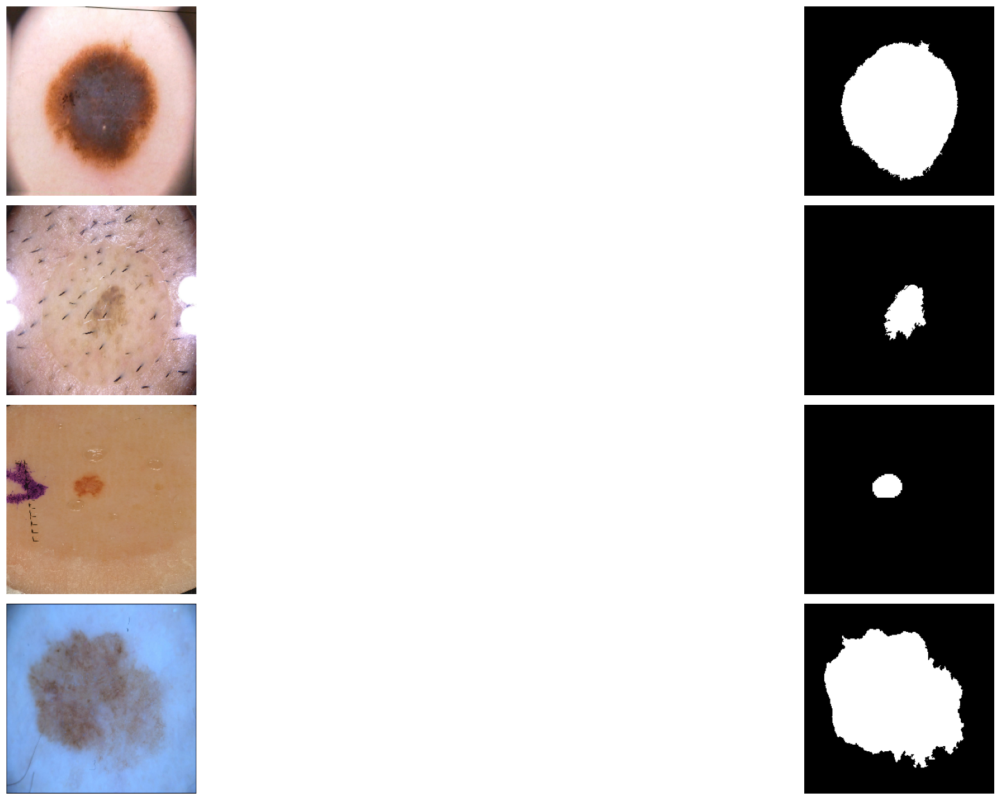

In [83]:
for image, label in train_ds.take(1):
    print(image.shape)
    print(label.shape)
    plt.subplots(figsize=(25, 25))
    for i in range(0, batch_size, 2):
        plt.subplot(batch_size, 2, i+1)
        plt.imshow(image[i])
        plt.axis('off')
        plt.subplot(batch_size, 2, i+2)
        plt.imshow(label[i], cmap='gray')
        plt.axis('off')
    plt.tight_layout()
    plt.show()
    break

In [84]:
test_ds = (
    tf.data.Dataset.list_files(test_images_path)
    .map(parse_image)
    .batch(1))

# Model

In [ ]:
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, Concatenate, Add, Multiply, ReLU, GlobalAveragePooling2D, Dense, Reshape, Activation
from tensorflow.keras.models import Model
from tensorflow.keras.layers import BatchNormalization, Layer
import tensorflow as tf

# Define SE block for attention refinement
def squeeze_excite_block(input_tensor, ratio=16):
    filters = input_tensor.shape[-1]
    se = GlobalAveragePooling2D()(input_tensor)
    se = Dense(filters // ratio, activation='relu')(se)
    se = Dense(filters, activation='sigmoid')(se)
    se = Reshape((1, 1, filters))(se)
    return Multiply()([input_tensor, se])

# Modified conv block with SE blocks
def conv_block(input, filters):
    x = Conv2D(filters, (3, 3), padding="same")(input)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Conv2D(filters, (3, 3), padding="same")(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    return squeeze_excite_block(x)

def residual_block(input, filters):
    x = conv_block(input, filters)
    shortcut = Conv2D(filters, (1, 1), padding="same")(input)
    x = Add()([x, shortcut])
    return x

# Enhanced attention block
def attention_block(x, g, inter_channels):
    theta_x = Conv2D(inter_channels, (1, 1), padding='same')(x)
    phi_g = Conv2D(inter_channels, (1, 1), padding='same')(g)
    f = ReLU()(Add()([theta_x, phi_g]))
    psi = Conv2D(1, (1, 1), padding='same', activation='sigmoid')(f)
    return Multiply()([x, psi])

# Improved model with refined downsampling and upsampling
def build_improved_attention_resunet(input_shape):
    inputs = Input(input_shape)
    
    # Encoder
    e1 = residual_block(inputs, 48)  # Increased initial filters
    p1 = Conv2D(48, (2, 2), strides=(2, 2), padding="same")(e1)  # Strided convolution for downsampling
    
    e2 = residual_block(p1, 96)
    p2 = Conv2D(96, (2, 2), strides=(2, 2), padding="same")(e2)
    
    e3 = residual_block(p2, 192)
    p3 = Conv2D(192, (2, 2), strides=(2, 2), padding="same")(e3)
    
    e4 = residual_block(p3, 384)
    p4 = Conv2D(384, (2, 2), strides=(2, 2), padding="same")(e4)

    # Bottleneck
    b = residual_block(p4, 768)
    
    # Decoder with refined upsampling
    d4 = Conv2DTranspose(384, (2, 2), strides=(2, 2), padding="same")(b)
    d4 = Concatenate()([d4, attention_block(e4, d4, 384)])
    d4 = residual_block(d4, 384)
    
    d3 = Conv2DTranspose(192, (2, 2), strides=(2, 2), padding="same")(d4)
    d3 = Concatenate()([d3, attention_block(e3, d3, 192)])
    d3 = residual_block(d3, 192)
    
    d2 = Conv2DTranspose(96, (2, 2), strides=(2, 2), padding="same")(d3)
    d2 = Concatenate()([d2, attention_block(e2, d2, 96)])
    d2 = residual_block(d2, 96)
    
    d1 = Conv2DTranspose(48, (2, 2), strides=(2, 2), padding="same")(d2)
    d1 = Concatenate()([d1, attention_block(e1, d1, 48)])
    d1 = residual_block(d1, 48)
    
    outputs = Conv2D(1, (1, 1), padding="same", activation="sigmoid")(d1)
    
    return Model(inputs, outputs)

model = build_improved_attention_resunet((256,256, 3))
model.summary()


In [85]:
# Metrics
def safe_divide(numerator, denominator):
    return numerator / (denominator + tf.keras.backend.epsilon())
def dice_coef(y_true, y_pred):
    smooth = 1e-7
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def jacard(y_true, y_pred):

    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    union = K.sum ( y_true_f + y_pred_f - y_true_f * y_pred_f)

    return intersection/union
def sensitivity(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    true_positives = tf.reduce_sum(y_true * y_pred)
    possible_positives = tf.reduce_sum(y_true)
    return safe_divide(true_positives, possible_positives)

def specificity(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    true_negatives = tf.reduce_sum((1 - y_true) * (1 - y_pred))
    possible_negatives = tf.reduce_sum(1 - y_true)
    return safe_divide(true_negatives, possible_negatives)

def mean_iou(y_true, y_pred):
    y_pred = tf.round(tf.clip_by_value(y_pred, 0, 1))
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    return safe_divide(intersection, union)

def precision(y_true, y_pred):
    y_pred = tf.round(tf.clip_by_value(y_pred, 0, 1))
    true_positives = tf.reduce_sum(y_true * y_pred)
    predicted_positives = tf.reduce_sum(y_pred)
    return safe_divide(true_positives, predicted_positives)

def f1_score(y_true, y_pred):
    y_pred = tf.round(tf.clip_by_value(y_pred, 0, 1))
    tp = tf.reduce_sum(y_true * y_pred)
    predicted_positives = tf.reduce_sum(y_pred)
    actual_positives = tf.reduce_sum(y_true)
    precision = safe_divide(tp, predicted_positives)
    recall = safe_divide(tp, actual_positives)
    return safe_divide(2 * precision * recall, precision + recall)


In [86]:
# Loss

def bce_dice_loss(y_true, y_pred):
    y_true = K.cast(y_true, dtype=y_pred.dtype)
    bce = K.mean(K.binary_crossentropy(y_true, y_pred), axis=-1)
    dice = dice_coef(y_true, y_pred)
    return bce - K.log(dice)

def bce_dice_loss_log(y_true, y_pred):
    y_true = K.cast(y_true, dtype=y_pred.dtype)
    bce = K.mean(K.binary_crossentropy(y_true, y_pred), axis=-1)
    dice = dice_coef(y_true, y_pred)
    return bce + 1 - dice

In [50]:

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss=bce_dice_loss_log, 
              metrics=[dice_coef, jacard, 'accuracy', f1_score,sensitivity, specificity,mean_iou])
# model.summary()

In [51]:
steps_per_epoch = int(len(train_images_path)*0.8 // batch_size)
val_steps = int(len(train_images_path)*0.2 // batch_size)
print(f"Batch Size: {batch_size}\nSteps_per_epoch: {steps_per_epoch}\nValidation_steps: {val_steps}")

Batch Size: 8
Steps_per_epoch: 207
Validation_steps: 51


In [52]:
class DisplaySegmentationResults(Callback):
    def __init__(self, dataset, num_images=1):
        super(DisplaySegmentationResults, self).__init__()
        self.dataset = dataset
        self.num_images = num_images

    def on_epoch_end(self, epoch, logs=None):
        for i, (image, mask) in enumerate(self.dataset.take(self.num_images)):
            # Predict the mask for the image
            predicted_mask = self.model.predict(image[0][np.newaxis, ...], verbose=0)[0]
            predicted_mask = (predicted_mask > 0.5).astype(np.uint8)

            fig, ax = plt.subplots(1, 3, figsize=(6, 2))
            ax[0].imshow(image[0])
            ax[0].set_title('Input Image')
            ax[1].imshow(mask[0, ..., 0], cmap='gray')
            ax[1].set_title('Ground Truth Mask')
            ax[2].imshow(predicted_mask[..., 0], cmap='gray')
            ax[2].set_title('Predicted Mask')

            for a in ax:
                a.axis('off')

            plt.suptitle(f"Epoch {epoch+1}, Sample {i+1}")
            plt.show()

In [53]:
callbacks = [
    EarlyStopping(monitor='val_dice_coef', patience=10, mode='max'),
    ModelCheckpoint(filepath='saved_model.keras', monitor='val_dice_coef', save_best_only=True),
    ReduceLROnPlateau(monitor='val_dice_coef', factor=0.2, patience=5, verbose=1, min_lr=5e-7),
    DisplaySegmentationResults(val_ds)
]

Epoch 1/50


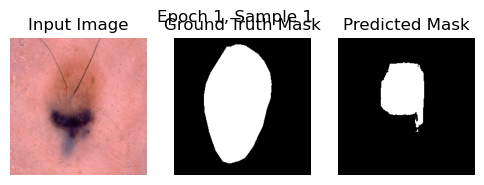

207/207 - 244s - loss: 0.6408 - dice_coef: 0.6711 - jacard: 0.5171 - accuracy: 0.8976 - f1_score: 0.7238 - sensitivity: 0.6998 - specificity: 0.9559 - mean_iou: 0.5827 - val_loss: 0.9969 - val_dice_coef: 0.5990 - val_jacard: 0.4364 - val_accuracy: 0.8369 - val_f1_score: 0.5907 - val_sensitivity: 0.4370 - val_specificity: 0.9937 - val_mean_iou: 0.4302 - lr: 0.0010 - 244s/epoch - 1s/step
Epoch 2/50


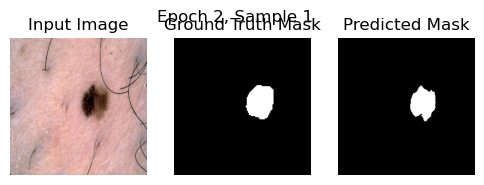

207/207 - 218s - loss: 0.5219 - dice_coef: 0.7244 - jacard: 0.5768 - accuracy: 0.9161 - f1_score: 0.7736 - sensitivity: 0.7589 - specificity: 0.9629 - mean_iou: 0.6418 - val_loss: 0.5958 - val_dice_coef: 0.7587 - val_jacard: 0.6153 - val_accuracy: 0.8928 - val_f1_score: 0.7863 - val_sensitivity: 0.7450 - val_specificity: 0.9494 - val_mean_iou: 0.6529 - lr: 0.0010 - 218s/epoch - 1s/step
Epoch 3/50


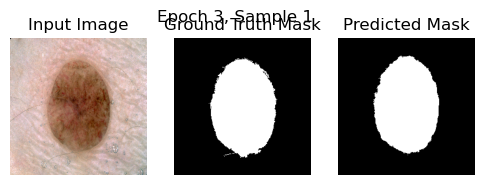

207/207 - 217s - loss: 0.4603 - dice_coef: 0.7550 - jacard: 0.6140 - accuracy: 0.9247 - f1_score: 0.7984 - sensitivity: 0.7905 - specificity: 0.9653 - mean_iou: 0.6734 - val_loss: 0.3938 - val_dice_coef: 0.8175 - val_jacard: 0.6950 - val_accuracy: 0.9195 - val_f1_score: 0.8522 - val_sensitivity: 0.8202 - val_specificity: 0.9631 - val_mean_iou: 0.7473 - lr: 0.0010 - 217s/epoch - 1s/step
Epoch 4/50


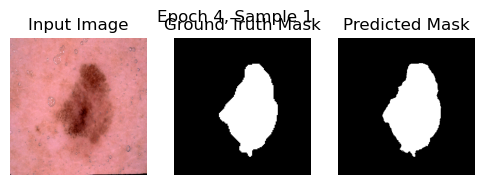

207/207 - 181s - loss: 0.4569 - dice_coef: 0.7577 - jacard: 0.6171 - accuracy: 0.9257 - f1_score: 0.8032 - sensitivity: 0.7954 - specificity: 0.9665 - mean_iou: 0.6795 - val_loss: 0.4561 - val_dice_coef: 0.7782 - val_jacard: 0.6407 - val_accuracy: 0.9150 - val_f1_score: 0.8260 - val_sensitivity: 0.7409 - val_specificity: 0.9857 - val_mean_iou: 0.7102 - lr: 0.0010 - 181s/epoch - 876ms/step
Epoch 5/50


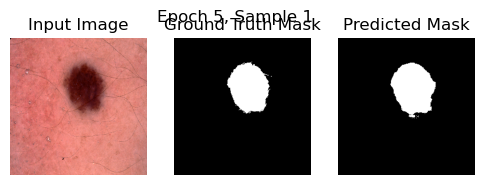

207/207 - 183s - loss: 0.4436 - dice_coef: 0.7662 - jacard: 0.6284 - accuracy: 0.9278 - f1_score: 0.8094 - sensitivity: 0.7936 - specificity: 0.9693 - mean_iou: 0.6885 - val_loss: 0.6235 - val_dice_coef: 0.7127 - val_jacard: 0.5594 - val_accuracy: 0.8843 - val_f1_score: 0.7435 - val_sensitivity: 0.6211 - val_specificity: 0.9920 - val_mean_iou: 0.6007 - lr: 0.0010 - 183s/epoch - 883ms/step
Epoch 6/50

Epoch 6: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.


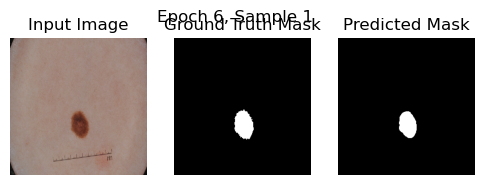

207/207 - 183s - loss: 0.4307 - dice_coef: 0.7720 - jacard: 0.6366 - accuracy: 0.9293 - f1_score: 0.8151 - sensitivity: 0.8028 - specificity: 0.9687 - mean_iou: 0.6970 - val_loss: 0.4915 - val_dice_coef: 0.7671 - val_jacard: 0.6256 - val_accuracy: 0.9049 - val_f1_score: 0.8096 - val_sensitivity: 0.7109 - val_specificity: 0.9865 - val_mean_iou: 0.6855 - lr: 0.0010 - 183s/epoch - 883ms/step
Epoch 7/50


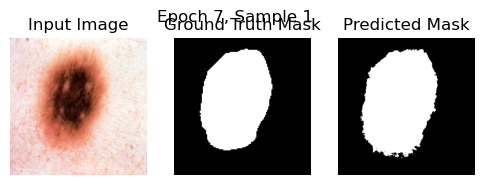

207/207 - 182s - loss: 0.3773 - dice_coef: 0.7977 - jacard: 0.6705 - accuracy: 0.9389 - f1_score: 0.8362 - sensitivity: 0.8225 - specificity: 0.9732 - mean_iou: 0.7263 - val_loss: 0.4161 - val_dice_coef: 0.7976 - val_jacard: 0.6689 - val_accuracy: 0.9225 - val_f1_score: 0.8439 - val_sensitivity: 0.7880 - val_specificity: 0.9764 - val_mean_iou: 0.7382 - lr: 2.0000e-04 - 182s/epoch - 879ms/step
Epoch 8/50


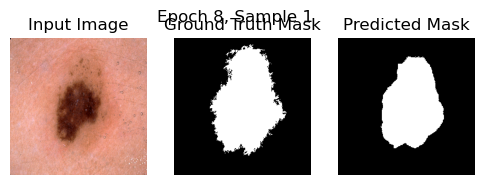

207/207 - 200s - loss: 0.3503 - dice_coef: 0.8106 - jacard: 0.6880 - accuracy: 0.9426 - f1_score: 0.8466 - sensitivity: 0.8353 - specificity: 0.9741 - mean_iou: 0.7413 - val_loss: 0.4428 - val_dice_coef: 0.8179 - val_jacard: 0.6972 - val_accuracy: 0.9165 - val_f1_score: 0.8409 - val_sensitivity: 0.7712 - val_specificity: 0.9796 - val_mean_iou: 0.7324 - lr: 2.0000e-04 - 200s/epoch - 967ms/step
Epoch 9/50


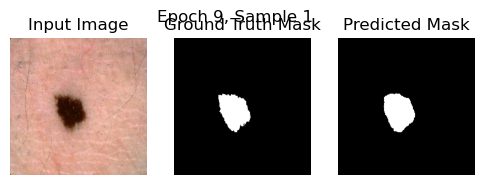

207/207 - 167s - loss: 0.3427 - dice_coef: 0.8189 - jacard: 0.6998 - accuracy: 0.9434 - f1_score: 0.8528 - sensitivity: 0.8380 - specificity: 0.9753 - mean_iou: 0.7507 - val_loss: 0.3909 - val_dice_coef: 0.8380 - val_jacard: 0.7251 - val_accuracy: 0.9251 - val_f1_score: 0.8620 - val_sensitivity: 0.8658 - val_specificity: 0.9514 - val_mean_iou: 0.7625 - lr: 2.0000e-04 - 167s/epoch - 808ms/step
Epoch 10/50


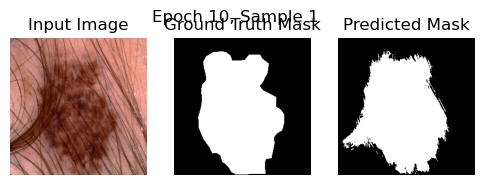

207/207 - 195s - loss: 0.3498 - dice_coef: 0.8122 - jacard: 0.6905 - accuracy: 0.9423 - f1_score: 0.8462 - sensitivity: 0.8345 - specificity: 0.9737 - mean_iou: 0.7409 - val_loss: 0.4042 - val_dice_coef: 0.8179 - val_jacard: 0.6975 - val_accuracy: 0.9206 - val_f1_score: 0.8459 - val_sensitivity: 0.8000 - val_specificity: 0.9680 - val_mean_iou: 0.7404 - lr: 2.0000e-04 - 195s/epoch - 944ms/step
Epoch 11/50

Epoch 11: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.


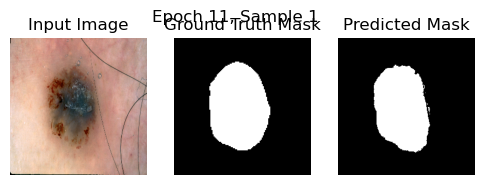

207/207 - 166s - loss: 0.3367 - dice_coef: 0.8220 - jacard: 0.7044 - accuracy: 0.9445 - f1_score: 0.8540 - sensitivity: 0.8399 - specificity: 0.9753 - mean_iou: 0.7524 - val_loss: 0.4280 - val_dice_coef: 0.8127 - val_jacard: 0.6895 - val_accuracy: 0.9143 - val_f1_score: 0.8405 - val_sensitivity: 0.8190 - val_specificity: 0.9515 - val_mean_iou: 0.7312 - lr: 2.0000e-04 - 166s/epoch - 800ms/step
Epoch 12/50


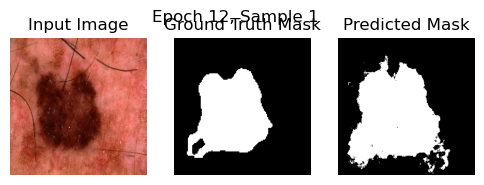

207/207 - 170s - loss: 0.3193 - dice_coef: 0.8282 - jacard: 0.7135 - accuracy: 0.9482 - f1_score: 0.8607 - sensitivity: 0.8516 - specificity: 0.9749 - mean_iou: 0.7632 - val_loss: 0.3602 - val_dice_coef: 0.8367 - val_jacard: 0.7240 - val_accuracy: 0.9279 - val_f1_score: 0.8651 - val_sensitivity: 0.8527 - val_specificity: 0.9582 - val_mean_iou: 0.7682 - lr: 4.0000e-05 - 170s/epoch - 821ms/step
Epoch 13/50


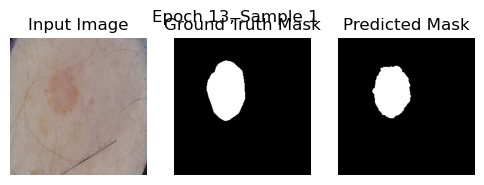

207/207 - 168s - loss: 0.3044 - dice_coef: 0.8352 - jacard: 0.7230 - accuracy: 0.9498 - f1_score: 0.8654 - sensitivity: 0.8523 - specificity: 0.9768 - mean_iou: 0.7696 - val_loss: 0.3863 - val_dice_coef: 0.8266 - val_jacard: 0.7084 - val_accuracy: 0.9235 - val_f1_score: 0.8549 - val_sensitivity: 0.8260 - val_specificity: 0.9639 - val_mean_iou: 0.7523 - lr: 4.0000e-05 - 168s/epoch - 814ms/step
Epoch 14/50


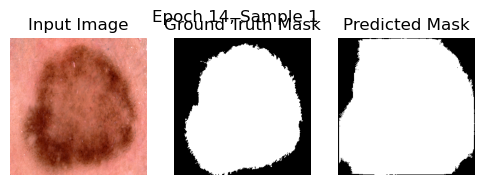

207/207 - 195s - loss: 0.2948 - dice_coef: 0.8432 - jacard: 0.7343 - accuracy: 0.9517 - f1_score: 0.8722 - sensitivity: 0.8575 - specificity: 0.9781 - mean_iou: 0.7790 - val_loss: 0.3612 - val_dice_coef: 0.8439 - val_jacard: 0.7346 - val_accuracy: 0.9283 - val_f1_score: 0.8646 - val_sensitivity: 0.8607 - val_specificity: 0.9526 - val_mean_iou: 0.7669 - lr: 4.0000e-05 - 195s/epoch - 943ms/step
Epoch 15/50


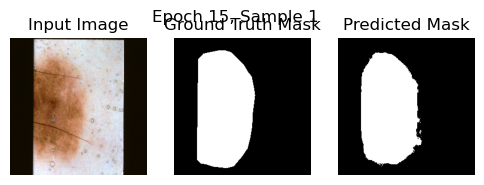

207/207 - 167s - loss: 0.2970 - dice_coef: 0.8413 - jacard: 0.7313 - accuracy: 0.9513 - f1_score: 0.8705 - sensitivity: 0.8596 - specificity: 0.9766 - mean_iou: 0.7764 - val_loss: 0.3827 - val_dice_coef: 0.8405 - val_jacard: 0.7297 - val_accuracy: 0.9273 - val_f1_score: 0.8601 - val_sensitivity: 0.8257 - val_specificity: 0.9667 - val_mean_iou: 0.7606 - lr: 4.0000e-05 - 167s/epoch - 809ms/step
Epoch 16/50

Epoch 16: ReduceLROnPlateau reducing learning rate to 8.000000525498762e-06.


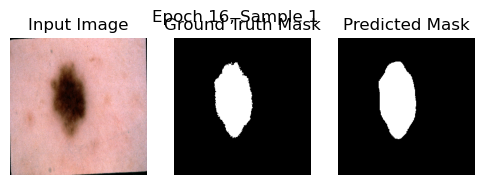

207/207 - 168s - loss: 0.3004 - dice_coef: 0.8435 - jacard: 0.7345 - accuracy: 0.9504 - f1_score: 0.8719 - sensitivity: 0.8531 - specificity: 0.9780 - mean_iou: 0.7782 - val_loss: 0.3792 - val_dice_coef: 0.8444 - val_jacard: 0.7347 - val_accuracy: 0.9285 - val_f1_score: 0.8620 - val_sensitivity: 0.8422 - val_specificity: 0.9632 - val_mean_iou: 0.7625 - lr: 4.0000e-05 - 168s/epoch - 811ms/step
Epoch 17/50


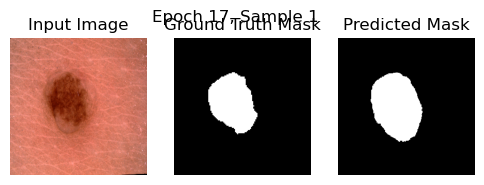

207/207 - 171s - loss: 0.2958 - dice_coef: 0.8437 - jacard: 0.7350 - accuracy: 0.9516 - f1_score: 0.8712 - sensitivity: 0.8594 - specificity: 0.9765 - mean_iou: 0.7777 - val_loss: 0.3871 - val_dice_coef: 0.8344 - val_jacard: 0.7220 - val_accuracy: 0.9261 - val_f1_score: 0.8554 - val_sensitivity: 0.8231 - val_specificity: 0.9638 - val_mean_iou: 0.7547 - lr: 8.0000e-06 - 171s/epoch - 826ms/step
Epoch 18/50


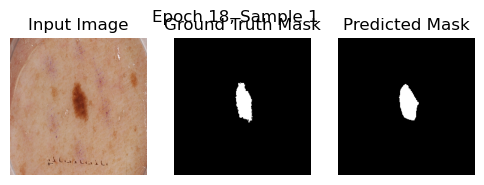

207/207 - 169s - loss: 0.2800 - dice_coef: 0.8487 - jacard: 0.7418 - accuracy: 0.9545 - f1_score: 0.8773 - sensitivity: 0.8647 - specificity: 0.9784 - mean_iou: 0.7865 - val_loss: 0.3975 - val_dice_coef: 0.8360 - val_jacard: 0.7264 - val_accuracy: 0.9226 - val_f1_score: 0.8538 - val_sensitivity: 0.8290 - val_specificity: 0.9623 - val_mean_iou: 0.7550 - lr: 8.0000e-06 - 169s/epoch - 815ms/step
Epoch 19/50


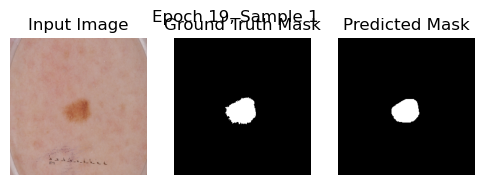

207/207 - 168s - loss: 0.2810 - dice_coef: 0.8500 - jacard: 0.7441 - accuracy: 0.9539 - f1_score: 0.8775 - sensitivity: 0.8624 - specificity: 0.9787 - mean_iou: 0.7869 - val_loss: 0.3993 - val_dice_coef: 0.8374 - val_jacard: 0.7273 - val_accuracy: 0.9245 - val_f1_score: 0.8555 - val_sensitivity: 0.8300 - val_specificity: 0.9631 - val_mean_iou: 0.7561 - lr: 8.0000e-06 - 168s/epoch - 813ms/step
Epoch 20/50


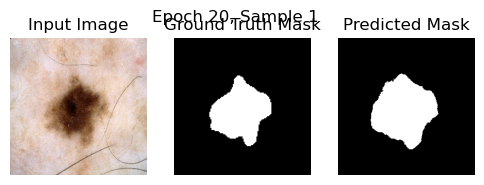

207/207 - 167s - loss: 0.2830 - dice_coef: 0.8506 - jacard: 0.7450 - accuracy: 0.9536 - f1_score: 0.8777 - sensitivity: 0.8633 - specificity: 0.9782 - mean_iou: 0.7873 - val_loss: 0.4079 - val_dice_coef: 0.8349 - val_jacard: 0.7221 - val_accuracy: 0.9227 - val_f1_score: 0.8518 - val_sensitivity: 0.8270 - val_specificity: 0.9598 - val_mean_iou: 0.7484 - lr: 8.0000e-06 - 167s/epoch - 808ms/step
Epoch 21/50

Epoch 21: ReduceLROnPlateau reducing learning rate to 1.6000001778593287e-06.


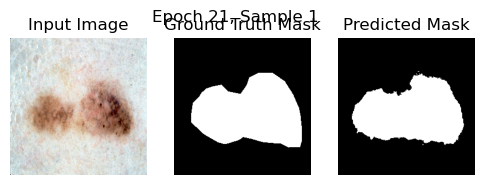

207/207 - 168s - loss: 0.2849 - dice_coef: 0.8508 - jacard: 0.7447 - accuracy: 0.9526 - f1_score: 0.8773 - sensitivity: 0.8633 - specificity: 0.9770 - mean_iou: 0.7859 - val_loss: 0.3943 - val_dice_coef: 0.8367 - val_jacard: 0.7250 - val_accuracy: 0.9242 - val_f1_score: 0.8559 - val_sensitivity: 0.8205 - val_specificity: 0.9662 - val_mean_iou: 0.7550 - lr: 8.0000e-06 - 168s/epoch - 812ms/step
Epoch 22/50


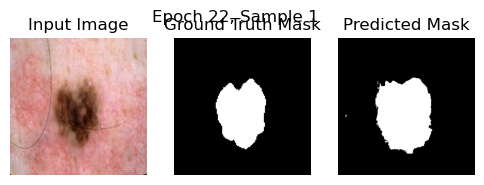

207/207 - 167s - loss: 0.2819 - dice_coef: 0.8495 - jacard: 0.7438 - accuracy: 0.9540 - f1_score: 0.8762 - sensitivity: 0.8573 - specificity: 0.9793 - mean_iou: 0.7855 - val_loss: 0.4032 - val_dice_coef: 0.8335 - val_jacard: 0.7203 - val_accuracy: 0.9232 - val_f1_score: 0.8511 - val_sensitivity: 0.8222 - val_specificity: 0.9615 - val_mean_iou: 0.7478 - lr: 1.6000e-06 - 167s/epoch - 809ms/step
Epoch 23/50


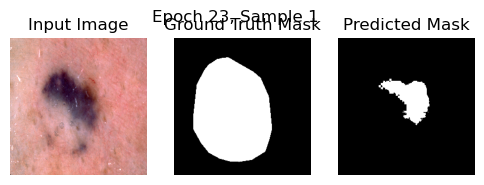

207/207 - 170s - loss: 0.2794 - dice_coef: 0.8504 - jacard: 0.7441 - accuracy: 0.9542 - f1_score: 0.8777 - sensitivity: 0.8653 - specificity: 0.9776 - mean_iou: 0.7867 - val_loss: 0.3977 - val_dice_coef: 0.8332 - val_jacard: 0.7228 - val_accuracy: 0.9238 - val_f1_score: 0.8495 - val_sensitivity: 0.8152 - val_specificity: 0.9642 - val_mean_iou: 0.7492 - lr: 1.6000e-06 - 170s/epoch - 822ms/step
Epoch 24/50


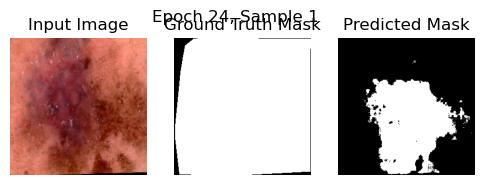

207/207 - 167s - loss: 0.2757 - dice_coef: 0.8532 - jacard: 0.7492 - accuracy: 0.9548 - f1_score: 0.8799 - sensitivity: 0.8652 - specificity: 0.9789 - mean_iou: 0.7913 - val_loss: 0.4152 - val_dice_coef: 0.8342 - val_jacard: 0.7205 - val_accuracy: 0.9187 - val_f1_score: 0.8517 - val_sensitivity: 0.8132 - val_specificity: 0.9623 - val_mean_iou: 0.7478 - lr: 1.6000e-06 - 167s/epoch - 805ms/step
Epoch 25/50


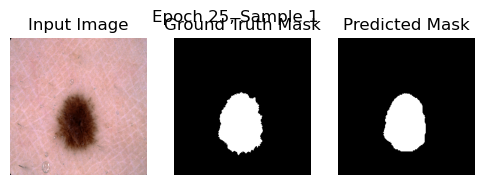

207/207 - 166s - loss: 0.2866 - dice_coef: 0.8503 - jacard: 0.7450 - accuracy: 0.9527 - f1_score: 0.8762 - sensitivity: 0.8602 - specificity: 0.9780 - mean_iou: 0.7858 - val_loss: 0.3932 - val_dice_coef: 0.8294 - val_jacard: 0.7157 - val_accuracy: 0.9272 - val_f1_score: 0.8483 - val_sensitivity: 0.8195 - val_specificity: 0.9649 - val_mean_iou: 0.7454 - lr: 1.6000e-06 - 166s/epoch - 800ms/step
Epoch 26/50

Epoch 26: ReduceLROnPlateau reducing learning rate to 5e-07.


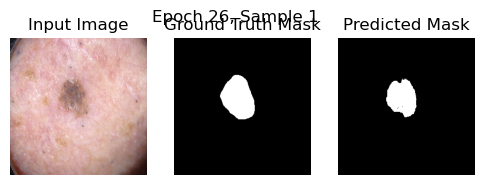

207/207 - 167s - loss: 0.2793 - dice_coef: 0.8523 - jacard: 0.7466 - accuracy: 0.9540 - f1_score: 0.8795 - sensitivity: 0.8654 - specificity: 0.9778 - mean_iou: 0.7891 - val_loss: 0.3990 - val_dice_coef: 0.8329 - val_jacard: 0.7195 - val_accuracy: 0.9252 - val_f1_score: 0.8513 - val_sensitivity: 0.8248 - val_specificity: 0.9657 - val_mean_iou: 0.7485 - lr: 1.6000e-06 - 167s/epoch - 806ms/step
CPU times: user 2h 47min 39s, sys: 47min 51s, total: 3h 35min 31s
Wall time: 1h 18min 5s


In [54]:
%%time

results = model.fit(train_ds, epochs=50, verbose=2,
                    steps_per_epoch=steps_per_epoch,
                    validation_steps=val_steps,
                    validation_data=val_ds,
                    callbacks=callbacks)

In [ ]:
from tensorflow.keras.layers import MultiHeadAttention, LayerNormalization, Dropout

# Transformer block for self-attention
def transformer_block(input_tensor, num_heads=2, key_dim=16, dropout=0.1):
    ...

    x = LayerNormalization()(input_tensor)
    attn_output = MultiHeadAttention(num_heads=num_heads, key_dim=key_dim)(x, x)
    attn_output = Dropout(dropout)(attn_output)
    x = Add()([attn_output, x])  # Residual connection
    # Feed-forward network
    x = LayerNormalization()(x)
    x_ff = Dense(4 * input_tensor.shape[-1], activation='relu')(x)
    x_ff = Dense(input_tensor.shape[-1])(x_ff)
    x = Add()([x_ff, x])  # Another residual connection
    return x

# Updated model with transformer blocks in encoder and bottleneck
def build_transformer_attention_resunet(input_shape):
    inputs = Input(input_shape)
    
    # Encoder without transformers
    e1 = residual_block(inputs, 48)  
    p1 = Conv2D(48, (2, 2), strides=(2, 2), padding="same")(e1)
    
    e2 = residual_block(p1, 96)
    p2 = Conv2D(96, (2, 2), strides=(2, 2), padding="same")(e2)
    
    e3 = residual_block(p2, 192)
    p3 = Conv2D(192, (2, 2), strides=(2, 2), padding="same")(e3)
    
    e4 = residual_block(p3, 384)
    p4 = Conv2D(384, (2, 2), strides=(2, 2), padding="same")(e4)
    
    # Bottleneck with transformer block
    b = residual_block(p4, 768)
    b = transformer_block(b, num_heads=4, key_dim=16)  # Transformer block in bottleneck only
    
    # Decoder
    d4 = Conv2DTranspose(384, (2, 2), strides=(2, 2), padding="same")(b)
    d4 = Concatenate()([d4, attention_block(e4, d4, 384)])
    d4 = residual_block(d4, 384)
    
    d3 = Conv2DTranspose(192, (2, 2), strides=(2, 2), padding="same")(d4)
    d3 = Concatenate()([d3, attention_block(e3, d3, 192)])
    d3 = residual_block(d3, 192)
    
    d2 = Conv2DTranspose(96, (2, 2), strides=(2, 2), padding="same")(d3)
    d2 = Concatenate()([d2, attention_block(e2, d2, 96)])
    d2 = residual_block(d2, 96)
    
    d1 = Conv2DTranspose(48, (2, 2), strides=(2, 2), padding="same")(d2)
    d1 = Concatenate()([d1, attention_block(e1, d1, 48)])
    d1 = residual_block(d1, 48)
    
    outputs = Conv2D(1, (1, 1), padding="same", activation="sigmoid")(d1)
    
    return Model(inputs, outputs)

model = build_transformer_attention_resunet((256, 256, 3))
model.summary()


In [98]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss=bce_dice_loss_log, 
              metrics=[dice_coef, jacard, 'accuracy', f1_score,sensitivity, specificity,mean_iou])

In [99]:
steps_per_epoch = int(len(train_images_path)*0.8 // batch_size)
val_steps = int(len(train_images_path)*0.2 // batch_size)
print(f"Batch Size: {batch_size}\nSteps_per_epoch: {steps_per_epoch}\nValidation_steps: {val_steps}")
class DisplaySegmentationResults(Callback):
    def __init__(self, dataset, num_images=1):
        super(DisplaySegmentationResults, self).__init__()
        self.dataset = dataset
        self.num_images = num_images

    def on_epoch_end(self, epoch, logs=None):
        for i, (image, mask) in enumerate(self.dataset.take(self.num_images)):
            # Predict the mask for the image
            predicted_mask = self.model.predict(image[0][np.newaxis, ...], verbose=0)[0]
            predicted_mask = (predicted_mask > 0.5).astype(np.uint8)

            fig, ax = plt.subplots(1, 3, figsize=(6, 2))
            ax[0].imshow(image[0])
            ax[0].set_title('Input Image')
            ax[1].imshow(mask[0, ..., 0], cmap='gray')
            ax[1].set_title('Ground Truth Mask')
            ax[2].imshow(predicted_mask[..., 0], cmap='gray')
            ax[2].set_title('Predicted Mask')

            for a in ax:
                a.axis('off')

            plt.suptitle(f"Epoch {epoch+1}, Sample {i+1}")
            plt.show()


Batch Size: 8
Steps_per_epoch: 207
Validation_steps: 51


In [100]:
callbacks = [
    EarlyStopping(monitor='val_dice_coef', patience=10, mode='max'),
    ModelCheckpoint(filepath='saved_model.keras', monitor='val_dice_coef', save_best_only=True),
    ReduceLROnPlateau(monitor='val_dice_coef', factor=0.2, patience=5, verbose=1, min_lr=5e-7),
    DisplaySegmentationResults(val_ds)
]

In [ ]:
%%time

results = model.fit(train_ds, epochs=50, verbose=2,
                    steps_per_epoch=steps_per_epoch,
                    validation_steps=val_steps,
                    validation_data=val_ds,
                    callbacks=callbacks)

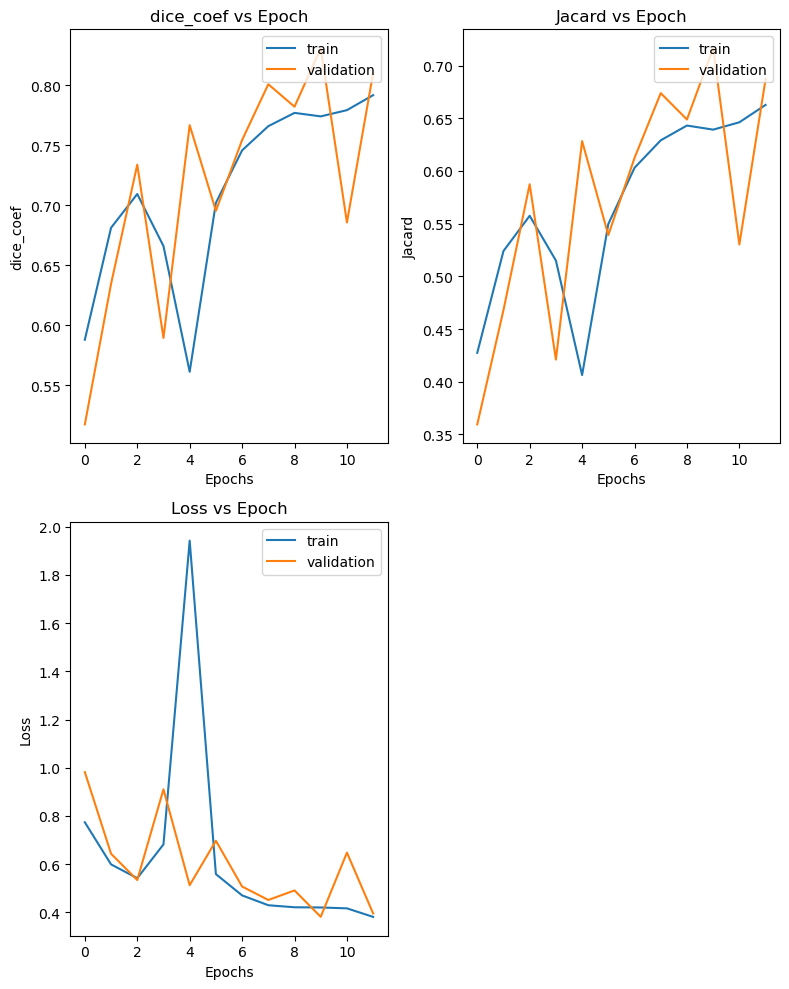

In [35]:
plt.subplots(figsize=(8, 10))

plt.subplot(2,2,1)
plt.plot(results.history['dice_coef'])
plt.plot(results.history['val_dice_coef'])
plt.title('dice_coef vs Epoch')
plt.xlabel('Epochs')
plt.ylabel('dice_coef')
plt.legend(['train', 'validation'], loc='upper right')
plt.tight_layout()

plt.subplot(2,2,2)
plt.plot(results.history['jacard'])
plt.plot(results.history['val_jacard'])
plt.title('Jacard vs Epoch')
plt.xlabel('Epochs')
plt.ylabel('Jacard')
plt.legend(['train', 'validation'], loc='upper right')
plt.tight_layout()

plt.subplot(2,2,3)
plt.plot(results.history['loss'])
plt.plot(results.history['val_loss'])
plt.title('Loss vs Epoch')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['train', 'validation'], loc='upper right')
plt.tight_layout()

plt.show()

In [36]:
K.clear_session()
raw_predictions = model.predict(test_ds)

1000/1000 [==============================] - 66s 65ms/step


In [37]:
predictions = np.where(raw_predictions < 0.5, 0, 1)

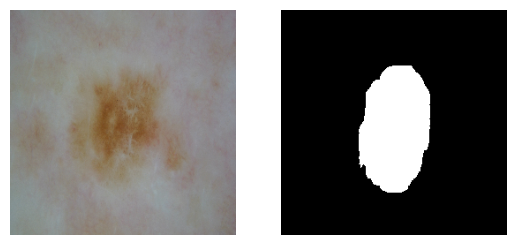

In [38]:
image = [images[0].numpy() for images in test_ds.take(1)]
# Looking at an example before creating saving outputs as image.
plt.subplot(1,2,1)
plt.axis('off')
plt.imshow(image[0]) # Using index 0 because it is in shape of (1, 256, 256, 1)
plt.subplot(1,2,2)
plt.axis('off')
plt.imshow(predictions[0], cmap='gray')
plt.show()

In [39]:
if not os.path.exists('predictions'):
    os.makedirs('predictions')

# loop through the predictions and save each one as an image
for i, pred in tqdm(enumerate(predictions)):
    pred = (pred * 255).astype(np.uint8)
    image = Image.fromarray(pred.squeeze())
    filename = f"prediction_{i}.png"
    image.save(os.path.join('predictions', filename))

1000it [00:01, 678.00it/s]


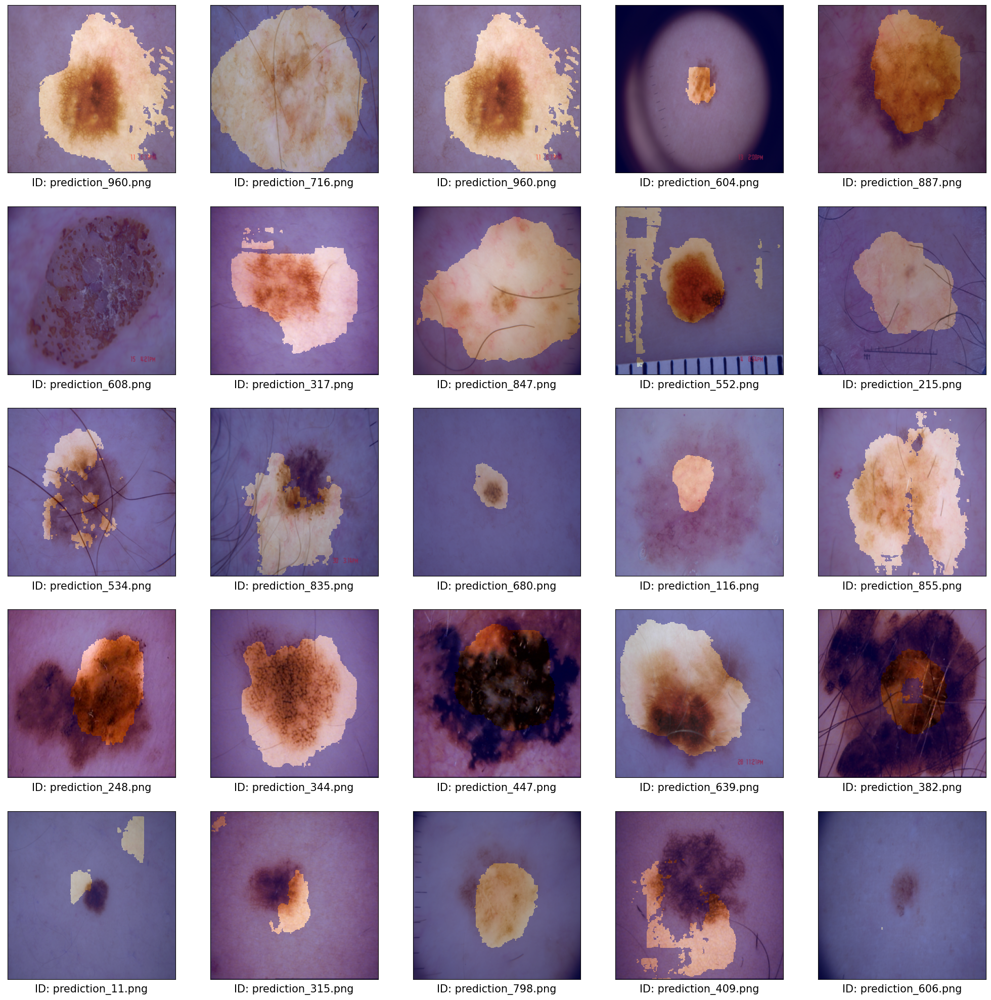

In [40]:
pred_folder_path = os.path.join(os.getcwd(), 'predictions')
pred_images_path = np.sort([os.path.join(pred_folder_path, i) for i in os.listdir(pred_folder_path) if i.endswith('.png')])
plot_segmentation_images(test_images_path, pred_images_path, size=256, Random=True)